## ***Mount Drive***

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## ***Importing Required Libraries***

In [2]:
import matplotlib.pyplot as plt
from matplotlib import image as mpimg

import torchvision.transforms.functional
from torchvision.utils import draw_segmentation_masks

import copy

import numpy as np
import random

from pathlib import Path

from PIL import Image
import PIL

from pandas.core.common import flatten

from torchvision.transforms.functional import InterpolationMode
from torchvision.models import MobileNet_V2_Weights

import os
import shutil
import time

import torch
from torch import nn
from torch import optim
import torchvision
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import Dataset, DataLoader

import skimage
from skimage import data,io
from skimage.filters import threshold_otsu, rank
from skimage.util import img_as_ubyte

from torchsummary import summary
from sklearn.neighbors import KNeighborsClassifier
import glob
from tqdm import tqdm

from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights
from torch.optim import lr_scheduler


from sklearn.metrics import classification_report

In [3]:
## Function to get train and val image names
def get_train_val_list():
  filename = '/content/drive/MyDrive/IISc/Jan-2023/AIP/Assignments/AIP2023-Assignment2/PascalVOC/PascalVOC/trainval/train.txt'
  train_list = []
  with open(filename) as file:
      while (line := file.readline().rstrip()):
        train_list.append(line)

  filename = '/content/drive/MyDrive/IISc/Jan-2023/AIP/Assignments/AIP2023-Assignment2/PascalVOC/PascalVOC/trainval/val.txt'
  val_list = []
  with open(filename) as file:
      while (line := file.readline().rstrip()):
        val_list.append(line)

  return train_list, val_list

## ***Custom Dataset***

In [4]:
## Custom class for PASCALVOC dataset
class SegmentationDataset(torch.utils.data.Dataset):
  
  def __init__(self, root, mode, image_list = None, transforms=None):
    data_paths_images = root + '/Images'
    data_paths_segmented = root + '/Annotations'
    image_paths = [] #to store image paths in list
    segmented_paths = [] #to store image annotation paths in list

    if mode == 'test':
      for data_path in glob.glob(data_paths_images + '/*'):
        file_path = Path(data_paths_segmented + '/' + data_path.split('/')[-1].split('.')[0] + '.png')
        if (file_path.is_file()):
          segmented_paths.append(data_paths_segmented + '/' + data_path.split('/')[-1].split('.')[0] + '.png')
          image_paths.append(data_path)

    else:
      for name in image_list:
        segmented_paths.append(data_paths_segmented + '/' + name + '.png')
        image_paths.append(data_paths_images + '/' + name + '.jpg')

    image_paths = list(flatten(image_paths))
    segmented_paths = list(flatten(segmented_paths))

    self.image_paths = image_paths
    self.segmented_paths = segmented_paths
    self.transforms = transforms

  def __len__(self):
    return len(self.image_paths)
  
  def __getitem__(self, idx):
    image_filepath = self.image_paths[idx]
    segmented_image_filepath = self.segmented_paths[idx]

    image = Image.open(image_filepath).convert('RGB')
    segmented_image = Image.open(segmented_image_filepath)

    if self.transforms is not None:
      image = self.transforms(image)
    resize_transform = transforms.Resize((224, 224), interpolation=InterpolationMode.NEAREST)
    convert_tensor = transforms.PILToTensor()
    segmented_image = resize_transform(convert_tensor(segmented_image))

    return image, segmented_image

## **Data Transforms**

In [5]:
##Data Transforms for train, test and val datasets
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

## ***Data Loaders***

In [6]:
##Preparing datasets
train_list, val_list = get_train_val_list()
train_set = SegmentationDataset('/content/drive/MyDrive/IISc/Jan-2023/AIP/Assignments/AIP2023-Assignment2/PascalVOC/PascalVOC/trainval', 'train', train_list, data_transforms['train'])
val_set = SegmentationDataset('/content/drive/MyDrive/IISc/Jan-2023/AIP/Assignments/AIP2023-Assignment2/PascalVOC/PascalVOC/trainval', 'val', val_list, data_transforms['val'])
test_set = SegmentationDataset('/content/drive/MyDrive/IISc/Jan-2023/AIP/Assignments/AIP2023-Assignment2/PascalVOC/PascalVOC/test', 'test', transforms = data_transforms['test'])

##dicts for train, val, test sets
image_datasets = {'train':train_set , 'val': val_set, 'test': test_set}
shuffle_datasets = {'train': True, 'val': True, 'test': False}

##Creating dataloader for train, val, test sets
dataloaders = { x : torch.utils.data.DataLoader(image_datasets[x], batch_size = 32, shuffle = shuffle_datasets[x], num_workers = 2) for x in ['train', 'val', 'test'] }

##Setting device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

[  0  15 255]


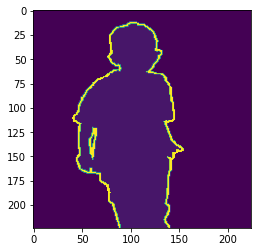

In [7]:
## Visualizing masks in train_Set
img2, img = train_set[143]
img1 = torch.squeeze(img).numpy()
print(np.unique(img1))
plt.imshow(img1)

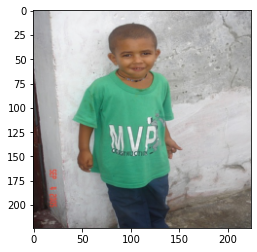

In [8]:
## Visualizing image in train_set
_ = img2.numpy().transpose((1, 2, 0))
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
inp = std * _ + mean
inp = np.clip(inp, 0, 1)
plt.imshow(inp)

## **Functions to Visualize model outputs**

In [9]:
### Color encoding for classes in PASCAL VOC dataset
label_map = [
               (0, 0, 0),  # background
               (128, 0, 0), # aeroplane
               (0, 128, 0), # bicycle
               (128, 128, 0), # bird
               (0, 0, 128), # boat
               (128, 0, 128), # bottle
               (0, 128, 128), # bus 
               (128, 128, 128), # car
               (64, 0, 0), # cat
               (192, 0, 0), # chair
               (64, 128, 0), # cow
               (192, 128, 0), # dining table
               (64, 0, 128), # dog
               (192, 0, 128), # horse
               (64, 128, 128), # motorbike
               (192, 128, 128), # person
               (0, 64, 0), # potted plant
               (128, 64, 0), # sheep
               (0, 192, 0), # sofa
               (128, 192, 0), # train
               (0, 64, 128) # tv/monitor
]

In [10]:
## Function to map label to correspoding color maps
def labelmap_to_image(labels):
    red_map = np.zeros_like(labels).astype(np.uint8)
    green_map = np.zeros_like(labels).astype(np.uint8)
    blue_map = np.zeros_like(labels).astype(np.uint8)
    
    for label_num in range(0, len(label_map)):
        index = labels == label_num
        red_map[index] = np.array(label_map)[label_num, 0]
        green_map[index] = np.array(label_map)[label_num, 1]
        blue_map[index] = np.array(label_map)[label_num, 2]
        
    image = np.stack([red_map, green_map, blue_map], axis=2)

    return image

In [11]:
invTrans = transforms.Compose([ transforms.Normalize(mean = [ 0., 0., 0. ],
                                                     std = [ 1/0.229, 1/0.224, 1/0.225 ]),
                                transforms.Normalize(mean = [ -0.485, -0.456, -0.406 ],
                                                     std = [ 1., 1., 1. ]),
                               ])

In [12]:
## Function used to visualize model output, ground_truth and their difference
def draw_segmentation_map(inps, outputs, ground_truth=None):

    inps = inps.detach().cpu()
    inps = invTrans(inps).numpy().transpose((1,2,0))

    outputs = torch.argmax(outputs.squeeze(), dim=0).detach().cpu().numpy()
    segmented_image = labelmap_to_image(outputs)
    

    
    if(ground_truth is not None):
      fig, axs = plt.subplots(ncols=4, squeeze=False, figsize=(30, 30))
      axs[0,0].imshow(inps)
      axs[0, 1].imshow(segmented_image)
      ground_truths = labelmap_to_image(ground_truth)
      diff_image = segmented_image - ground_truths
      axs[0, 2].imshow(ground_truths)
      axs[0,3].imshow(diff_image)
    
    else:
      fig, axs = plt.subplots(ncols=2, squeeze=False, figsize=(30, 30))
      axs[0,0].imshow(inps)
      axs[0, 1].imshow(segmented_image)
      
    return segmented_image

## ***M-IOU***

In [13]:
## Function to get miou for each image
def get_miou(output, ground_truth):
    output = torch.argmax(output.squeeze(), dim=0).detach().cpu().numpy()
    num_categories = 21

    total_iou = 0

    for label_num in range(num_categories):
      category_map = np.ones_like(ground_truth).astype(np.uint8)*label_num
      intersection_map = np.logical_and(output == category_map, ground_truth == category_map)
      union_map = np.logical_or(output == category_map, ground_truth == category_map)
      if(np.sum(union_map) == 0) :
        iou_category = 1
      else:
        iou_category = np.sum(intersection_map) / np.sum(union_map)
      total_iou += iou_category

    miou = total_iou / num_categories

    # print(miou*100)
    return miou

## **Pixel Accuracy**

In [14]:
## Function to get pixel accuracy fro each image
def get_pixel_accuracy(output, ground_truth):
  # print(ground_truth.shape)
  output = torch.argmax(output.squeeze(), dim=0).detach().cpu().numpy()
  matching_pixels = np.sum(output == ground_truth)
  total_pixels = ground_truth.shape[0]*ground_truth.shape[1]

  pixel_accuracy = matching_pixels/total_pixels
  # print(pixel_accuracy*100)
  return pixel_accuracy

In [15]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    model.to(device)
    with torch.no_grad():
        for images, labels in dataloaders['test']:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            outs = outputs
            for j in range(images.size()[0]):
                draw_segmentation_map(images[j], outs[j],torch.squeeze(labels[j]).cpu().numpy())
        
            return

## **Helper Functions Used to define model**

In [16]:
## Function for bilinear initialization for weights of convtranspose kernel
def bilinear_kernel(in_channels, out_channels, kernel_size):
    factor = (kernel_size + 1) // 2
    if kernel_size % 2 == 1:
        center = factor - 1
    else:
        center = factor - 0.5
    og = (torch.arange(kernel_size).reshape(-1, 1),
          torch.arange(kernel_size).reshape(1, -1))
    filt = (1 - torch.abs(og[0] - center) / factor) * \
           (1 - torch.abs(og[1] - center) / factor)
    weight = torch.zeros((in_channels, out_channels,
                          kernel_size, kernel_size))
    # weight[range(in_channels), range(out_channels), :, :] = filt
    for i in range(out_channels):
        for j in range(in_channels):
            if i == j:
                weight[i, j, :, :] = filt
    return weight

In [17]:
## Class to define upsample block
class UpsampleBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UpsampleBlock, self).__init__()
        self.conv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

## **Model**

In [18]:
##Class to define the model
class MobileNetV2FCN(torch.nn.Module):
  def __init__(self, num_classes):
    super().__init__()
    model = torchvision.models.mobilenet_v2(weights = MobileNet_V2_Weights.IMAGENET1K_V1)
    model = nn.Sequential(*list(model.children())[:-1])
    for param in model.parameters():
            param.requires_grad = False
            
    self.upsample_1 = UpsampleBlock(1280, 512) ##14
    self.upsample_2 = UpsampleBlock(512, 256)  ##28
    self.upsample_3 = UpsampleBlock(256, 128)  ##56
    self.upsample_4 = UpsampleBlock(128, 64)   ##112
    self.upsample_5 = UpsampleBlock(64, 21)    ##224
    

    W1 = bilinear_kernel(1280, 512, 4)
    W2 = bilinear_kernel(512, 256, 4)
    W3 = bilinear_kernel(256, 128, 4)
    W4 = bilinear_kernel(128, 64, 4)
    W5 = bilinear_kernel(64, 21, 4)

    self.upsample_1.conv.weight.data.copy_(W1)
    self.upsample_2.conv.weight.data.copy_(W2)
    self.upsample_3.conv.weight.data.copy_(W3)
    self.upsample_4.conv.weight.data.copy_(W4)
    self.upsample_5.conv.weight.data.copy_(W5)


    self.model = model
  
  def forward(self, x):
    out = self.model(x)
    out = self.upsample_1(out)
    out = self.upsample_2(out)
    out = self.upsample_3(out)
    out = self.upsample_4(out)
    out = self.upsample_5(out)
    return out

In [19]:
## model Initialization
model_ex = MobileNetV2FCN(21)
model_ex.to(device)

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


  0%|          | 0.00/13.6M [00:00<?, ?B/s]

MobileNetV2FCN(
  (upsample_1): UpsampleBlock(
    (conv): ConvTranspose2d(1280, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
  )
  (upsample_2): UpsampleBlock(
    (conv): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
  )
  (upsample_3): UpsampleBlock(
    (conv): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
  )
  (upsample_4): UpsampleBlock(
    (conv): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
  )
 

## **Model Summary**

In [20]:
summary(model_ex, (3,224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
             ReLU6-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]             288
       BatchNorm2d-5         [-1, 32, 112, 112]              64
             ReLU6-6         [-1, 32, 112, 112]               0
            Conv2d-7         [-1, 16, 112, 112]             512
       BatchNorm2d-8         [-1, 16, 112, 112]              32
  InvertedResidual-9         [-1, 16, 112, 112]               0
           Conv2d-10         [-1, 96, 112, 112]           1,536
      BatchNorm2d-11         [-1, 96, 112, 112]             192
            ReLU6-12         [-1, 96, 112, 112]               0
           Conv2d-13           [-1, 96, 56, 56]             864
      BatchNorm2d-14           [-1, 96,

## **Model Training**

In [21]:
##Function to train model
def train_model(model, scheduler, dataloaders, criterion, optimizer, num_epochs=25):
  since = time.time()

  best_model_wts = copy.deepcopy(model.state_dict)     ##state_dict - Python dicionary which maps each layer to its parameter tensor
  best_loss = np.inf

  for epoch in range(num_epochs):
    print(f'Epoch {epoch}/{num_epochs - 1}')
    print('-' * 10)

    for phase in ['train', 'val']:
      if phase == 'train':
        model.train()
      else:
        model.eval()
    
      running_loss = 0.00
      running_corrects = 0

      for inputs, masks in dataloaders[phase]:
        inputs = inputs.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()   # zero the parameter gradients at the start of training loop
        

        with torch.set_grad_enabled(phase == 'train'):
          outputs = model(inputs)
          masks = masks.clone().squeeze().detach().long()
          outputs = outputs.type(torch.float64)

          loss = criterion(outputs, masks)
          
          if phase == 'train':
            loss.backward()
            optimizer.step()

        running_loss += loss.item() * inputs.size(0)
              

      if phase == 'train':
        scheduler.step()

      epoch_loss = running_loss / (len(dataloaders[phase].dataset)*224*224)

      print('{} Loss: {:.16f}'.format(phase, epoch_loss))

      if phase == 'val' and epoch_loss < best_loss:
          best_loss = epoch_loss
          best_model_wts = copy.deepcopy(model.state_dict())

    print()

  time_elapsed = time.time() - since
  print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))

  model.load_state_dict(best_model_wts)
  return model


In [22]:
##Setting hyperparameters for training
params_to_update = []
for name,param in model_ex.named_parameters():
  if param.requires_grad == True:
    params_to_update.append(param)
    print("Parameters to Update by optimizer:",name)
    
optimizer_ft = optim.SGD(params_to_update, lr=0.001, momentum=0.9)

criterion = nn.CrossEntropyLoss(ignore_index=255)

exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=70, gamma=1)
model_ex = train_model(model_ex, exp_lr_scheduler, dataloaders, criterion, optimizer_ft, 150)

Parameters to Update by optimizer: upsample_1.conv.weight
Parameters to Update by optimizer: upsample_1.conv.bias
Parameters to Update by optimizer: upsample_1.bn.weight
Parameters to Update by optimizer: upsample_1.bn.bias
Parameters to Update by optimizer: upsample_2.conv.weight
Parameters to Update by optimizer: upsample_2.conv.bias
Parameters to Update by optimizer: upsample_2.bn.weight
Parameters to Update by optimizer: upsample_2.bn.bias
Parameters to Update by optimizer: upsample_3.conv.weight
Parameters to Update by optimizer: upsample_3.conv.bias
Parameters to Update by optimizer: upsample_3.bn.weight
Parameters to Update by optimizer: upsample_3.bn.bias
Parameters to Update by optimizer: upsample_4.conv.weight
Parameters to Update by optimizer: upsample_4.conv.bias
Parameters to Update by optimizer: upsample_4.bn.weight
Parameters to Update by optimizer: upsample_4.bn.bias
Parameters to Update by optimizer: upsample_5.conv.weight
Parameters to Update by optimizer: upsample_5.

## **Model Visualization**

<ipython-input-12-e147f1c553de>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(ncols=4, squeeze=False, figsize=(30, 30))


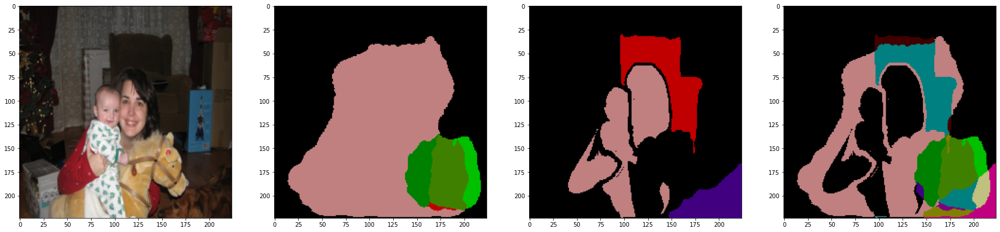

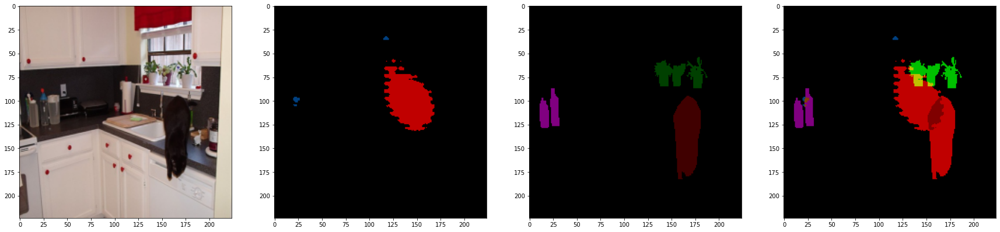

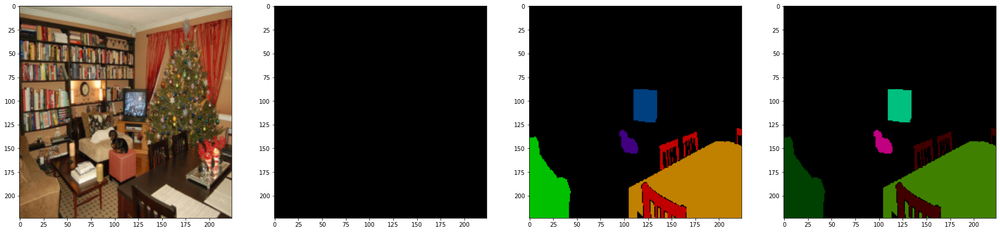

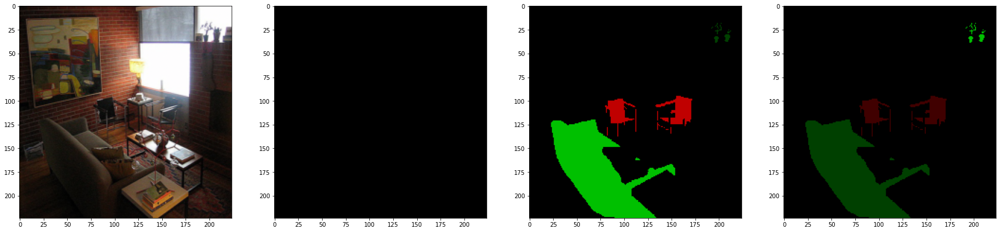

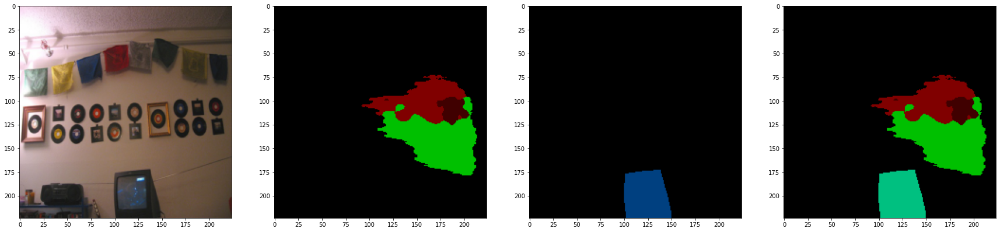

...

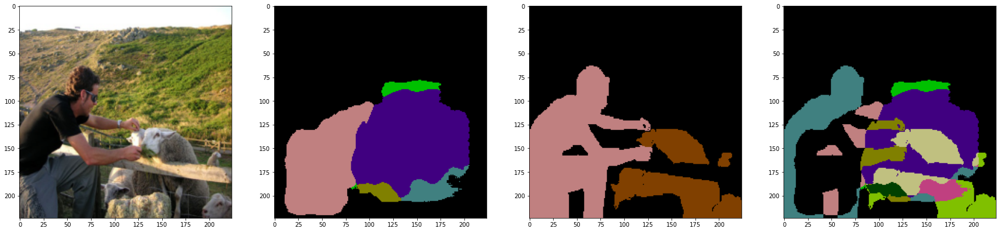

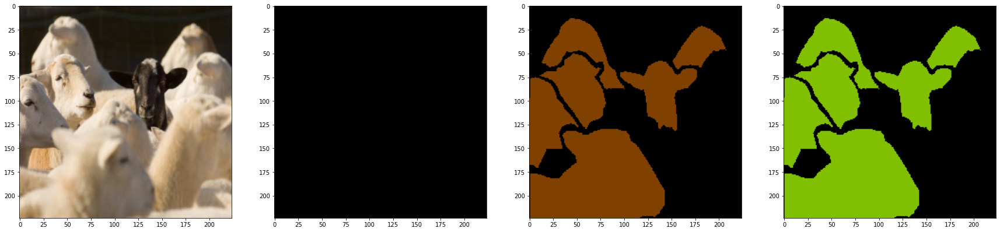

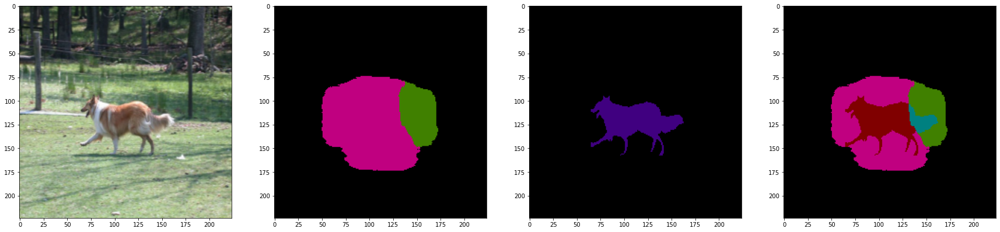

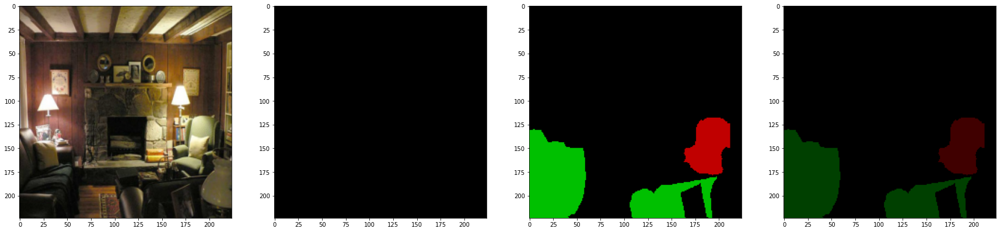

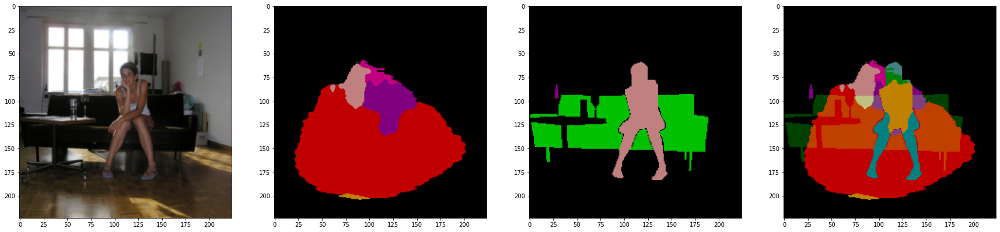

In [23]:
model_ex.eval()
visualize_model(model_ex, 4)

## **Model Testing**

In [24]:
def test_model(model):
  model.to(device)
  model.eval()
  pixel_accuracies = []
  miou = []
  with torch.no_grad():
      for images, masks in dataloaders['test']:
          images = images.to(device)
          masks = masks.to(device)

          outputs = model(images)
          outs = outputs

          for j in range(images.size()[0]):
              pixel_accuracies.append(get_pixel_accuracy(outs[j],torch.squeeze(masks[j]).cpu().numpy()))
              miou.append(get_miou(outs[j],torch.squeeze(masks[j]).cpu().numpy()))

  pixel_accuracy = np.array(pixel_accuracies).mean()
  miou_acc = np.array(miou).mean()

  print("Pixel Accuracy - {}".format(pixel_accuracy*100))
  print("MIOU -  {}".format(miou_acc*100))

  return pixel_accuracy, miou_acc 

## **Model Accuracy**

In [25]:
pxel_acc, miou = test_model(model_ex)

Pixel Accuracy - 71.20890655369291
MIOU -  81.37229567087272


In [26]:
img_test_4 = Image.open('/content/drive/MyDrive/IISc/Jan-2023/AIP/Assignments/AIP2023-Assignment2/test_images/test_images/test4.jpg').convert('RGB')
img_test_4 = data_transforms['test'](img_test_4)

In [27]:
def visualize_model_image(model, image):
    was_training = model.training
    model.eval()
    model.to(device)
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((224,224)),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    with torch.no_grad():
      images = transform(image)
      images = torch.unsqueeze(images,dim = 0)
      images = images.to(device, dtype = torch.float)
      outputs = model(images)
      outs = outputs
      draw_segmentation_map(images.squeeze(), outs)

      return

## ***Visualize Test Images (Orignal image)***



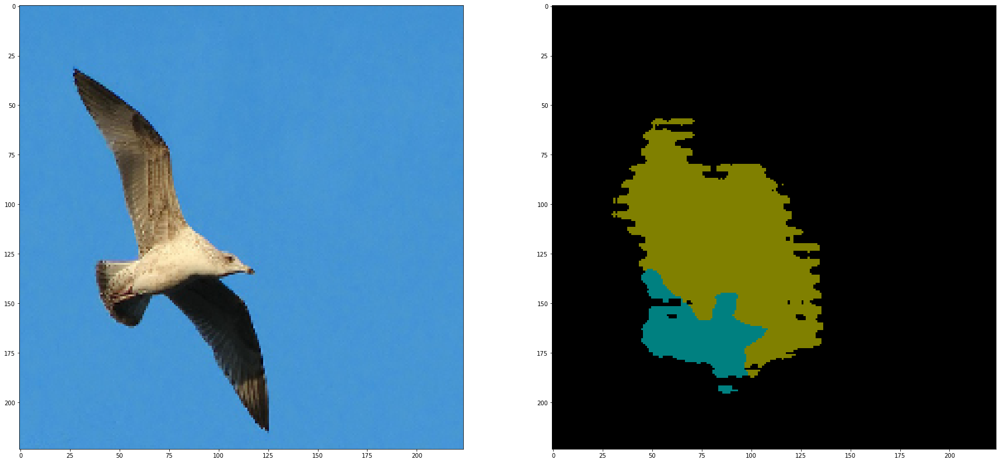

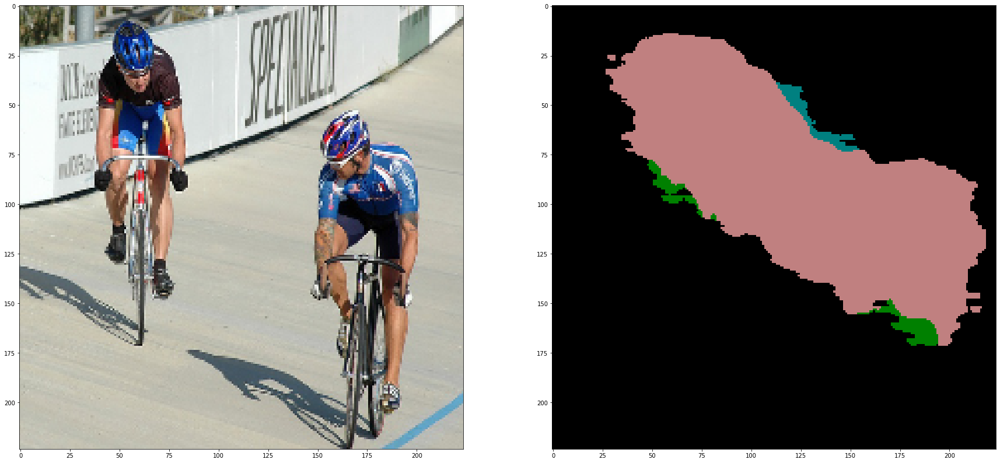

In [28]:
img_test_4 = Image.open('/content/drive/MyDrive/IISc/Jan-2023/AIP/Assignments/AIP2023-Assignment2/test_images/test_images/test4.jpg').convert('RGB')
img_test_5 = Image.open('/content/drive/MyDrive/IISc/Jan-2023/AIP/Assignments/AIP2023-Assignment2/test_images/test_images/test5.jpg').convert('RGB')

visualize_model_image(model_ex, img_test_4)
visualize_model_image(model_ex, img_test_5)

## ***Visualize Test Images (Rotated, Gaussian image)***


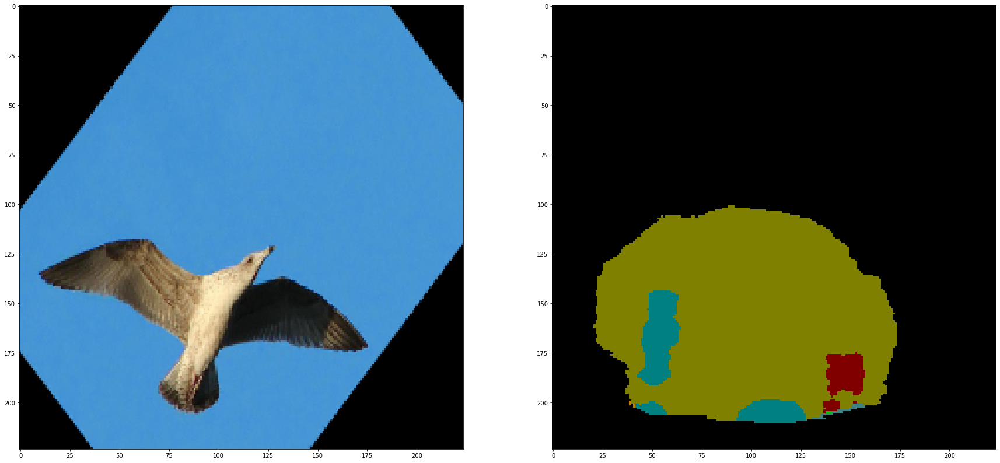

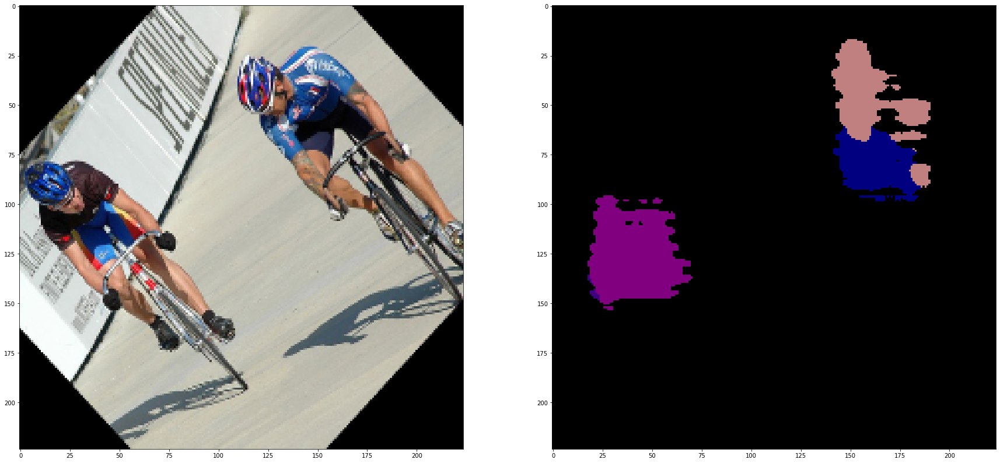

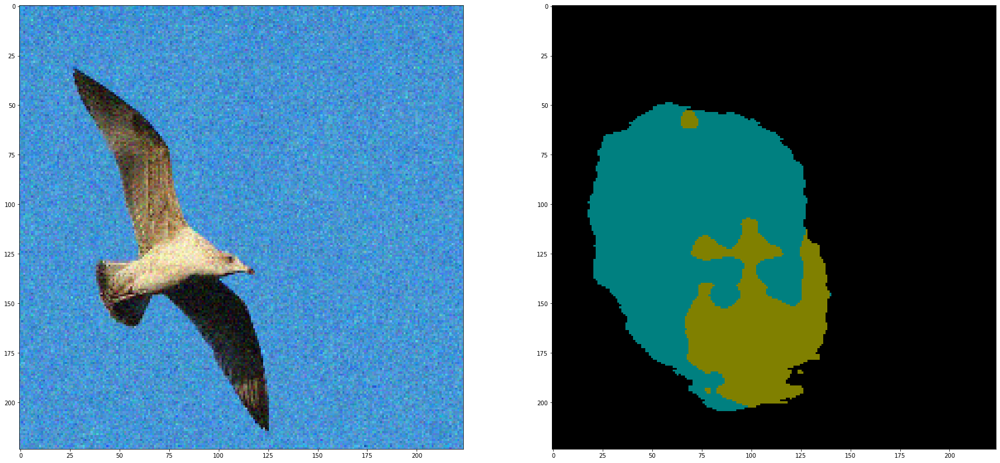

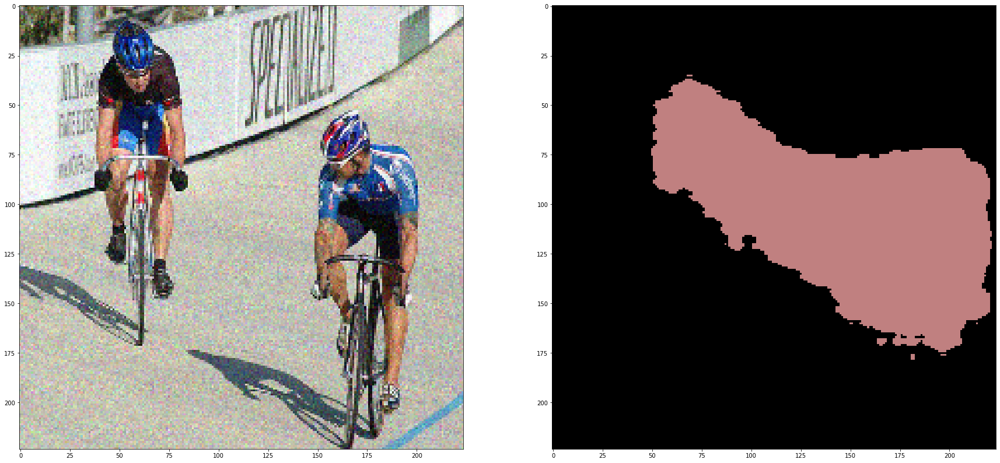

In [29]:
Ncut_data_dir = '/content/drive/MyDrive/IISc/Jan-2023/AIP/Assignments/AIP2023-Assignment2/test_images/test_images'
load_pattern = os.path.join(Ncut_data_dir, '*jpg') + ':' + os.path.join(Ncut_data_dir, '*png')
test_images = io.imread_collection(load_pattern)

eagle = test_images[3]
cycle = test_images[4]
eagle_rotated = skimage.transform.rotate(eagle, 45)
cycle_rotated = skimage.transform.rotate(cycle, 45)
eagle_noisy = skimage.util.random_noise(eagle, mode='gaussian')
cycle_noisy= skimage.util.random_noise(cycle, mode='gaussian')

visualize_model_image(model_ex, eagle_rotated)
visualize_model_image(model_ex, cycle_rotated)

visualize_model_image(model_ex, eagle_noisy)
visualize_model_image(model_ex, cycle_noisy)
